# Calculate CONCH scores for the QUILT-1m dataset

### Prerequisites 

Please install CONCH from its github repository first:
- https://github.com/mahmoodlab/CONCH 

In [5]:
from conch.open_clip_custom import create_model_from_pretrained, tokenize, get_tokenizer
import torch
import os
from PIL import Image
from pathlib import Path

# show all jupyter output
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## Load CONCH model

This model needs to be retrieved from the authors on huggingface: https://huggingface.co/MahmoodLab/CONCH, after agreeing to the license. You will need the file https://huggingface.co/MahmoodLab/CONCH/blob/main/pytorch_model.bin

In [6]:
model_cfg = 'conch_ViT-B-16'
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
checkpoint_path = '../CONCH/checkpoints/conch/pytorch_model.bin'
model, preprocess = create_model_from_pretrained(model_cfg, checkpoint_path, device=device)
_ = model.eval()

In [7]:
import pandas as pd 
bpath='/data/patho/text2image/QUILT_1M/quilt_1m/' # set proper path to full QUILT-1m dataset
df=pd.read_csv(bpath+'../quilt_1M_lookup.csv')


In [10]:
tokenizer = get_tokenizer()
sim_scores = []
from tqdm import tqdm

for f,t in tqdm(zip(df.image_path,df.caption)):
    image = Image.open(bpath+'/'+f)
    image_tensor = preprocess(image).unsqueeze(0).to(device)
    #image.resize((224, 224))
    
    prompts=[t]
    tokenized_prompts = tokenize(texts=prompts, tokenizer=tokenizer).to(device)
    with torch.inference_mode():
        image_embedings = model.encode_image(image_tensor)
        text_embedings = model.encode_text(tokenized_prompts)
        sim_score = (image_embedings @ text_embedings.T * model.logit_scale.exp()).cpu().numpy()

    sim_scores.append(sim_score[0][0])
    

672826it [3:58:32, 27.90it/s]/home/marc/venv/lib/python3.10/site-packages/PIL/Image.py:981: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
1017708it [6:35:50, 42.85it/s]


In [9]:
df.head()

,Unnamed: 0,caption,image_path,subset,split,pathology,roi_text,noisy_text,corrected_text,med_umls_ids,magnification,height,width,not_histology,single_wsi
0,0,"Peritoneum, Day 4 These two biopsies (1 & 2) w...",994701482116173824_0.jpg,openpath,train,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1
1,1,"Teenager with a large hemispheric tumor.""PNET""...",1574546082503139328_0.png,openpath,train,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1
2,2,Nephrogenic systemic fibrosis is a fibrotic di...,dTr3MNl1FxE_image_c54e9a8d-9348-456a-9645-3b89...,quilt,train,"['Dermatopathology', 'Soft tissue', 'Breast']",[],some eosinophils in there as well. So just re...,some eosinophils in there as well. So just re...,"[[{'entity': 'Presence', 'concept_id': 'C01503...",0.0,1040.0,1920.0,0,0
3,3,"The breast tissue shows hyperplasia, which is ...",YC5jOhcQGes_image_ede69e4d-0be4-4a06-a522-0c07...,quilt,train,"['Breast', 'Gynecologic', 'Soft tissue']",['Breast tissue with hyperplasia'],tissue. So this is totally consistent with hy...,tissue. So this is totally consistent with hy...,"[[{'entity': 'breast tissue', 'concept_id': 'C...",1.0,480.0,522.0,0,1
4,4,There is little secreted milk material in the ...,YC5jOhcQGes_image_ede69e4d-0be4-4a06-a522-0c07...,quilt,train,"['Breast', 'Gynecologic', 'Soft tissue']",['Breast tissue with hyperplasia'],tissue. So this is totally consistent with hy...,tissue. So this is totally consistent with hy...,"[[{'entity': 'breast tissue', 'concept_id': 'C...",1.0,480.0,522.0,0,1


In [12]:
df['conch_score'] = sim_scores

In [11]:
df.__len__(), len(sim_scores)

(1017708, 1017708)

In [13]:
df.to_csv('metadata_conch.csv')

In [14]:
import numpy as np
torch.save(torch.Tensor(np.stack(sim_scores)),'conch_scores.pth')

<Axes: >

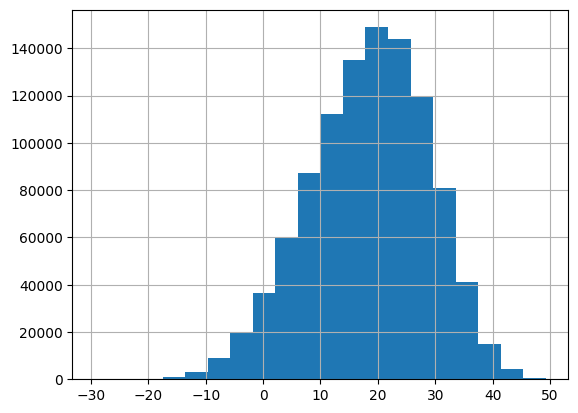

In [15]:
df.conch_score.hist(bins=20)

In [16]:
best_descr=df.conch_score>40

# Display

Show some high-value scores (text-image alignment is good)

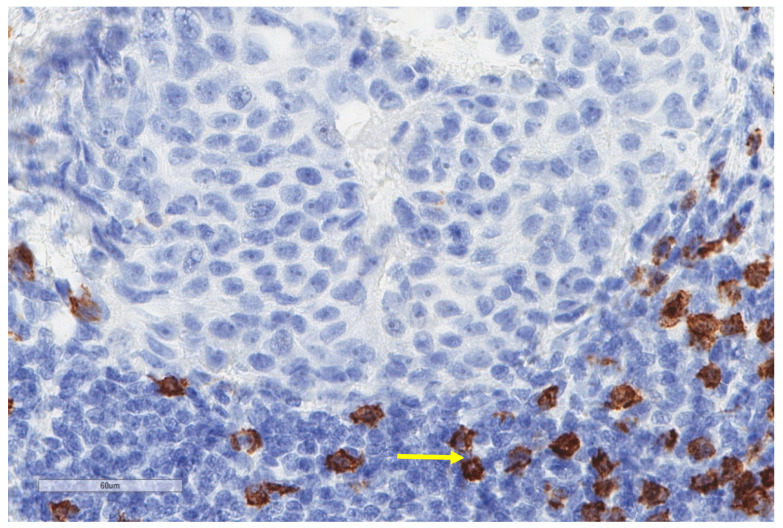

In comparison to the previous case, this malignant mesothelioma harbors few CD8+ lymphocytes (arrow), mostly in the peritumoral compartment (X400).


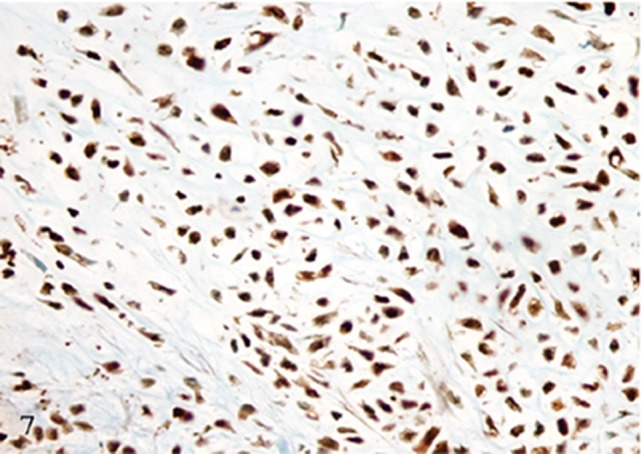

Pygmy goat, lung, pleura: Diffusely the neoplastic cells demonstrate strong nuclear immunoreactivity to S-100 protein. S-100 protein. 400×.


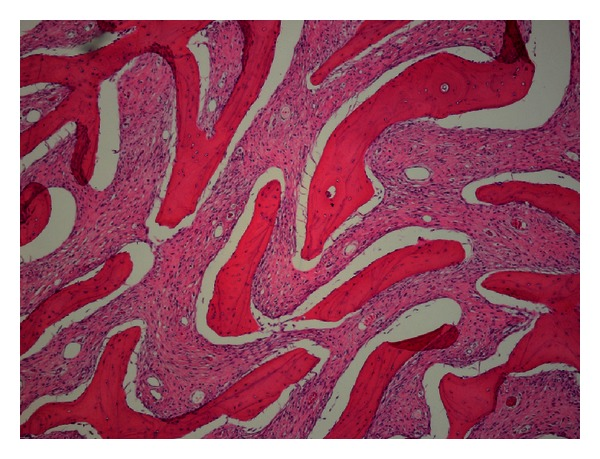

Microscopic examination of the mass revealed moderately atypical fibroblastic cells surrounding parallel trabeculae of woven bone.


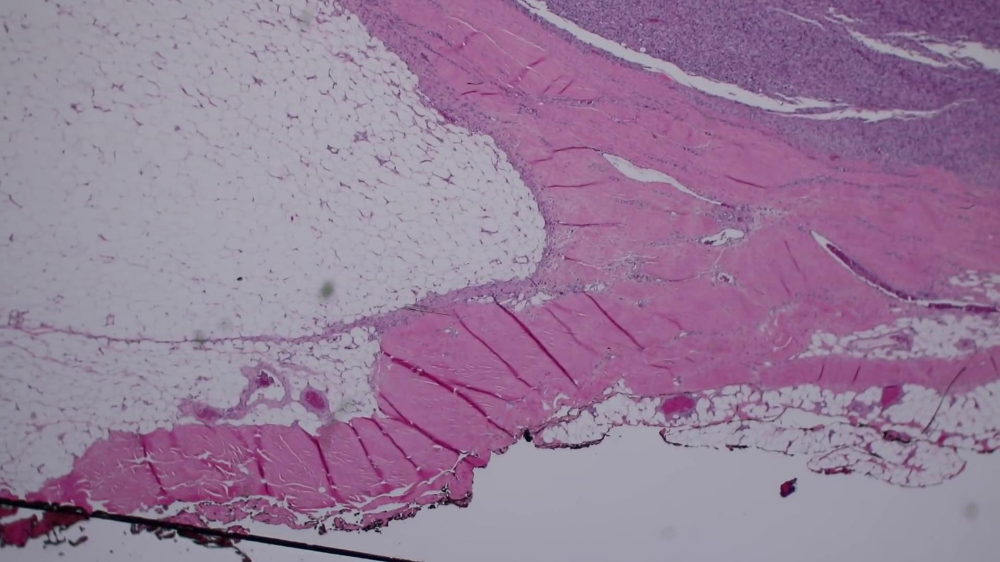

A sarcoma is present in the subcutaneous fat.


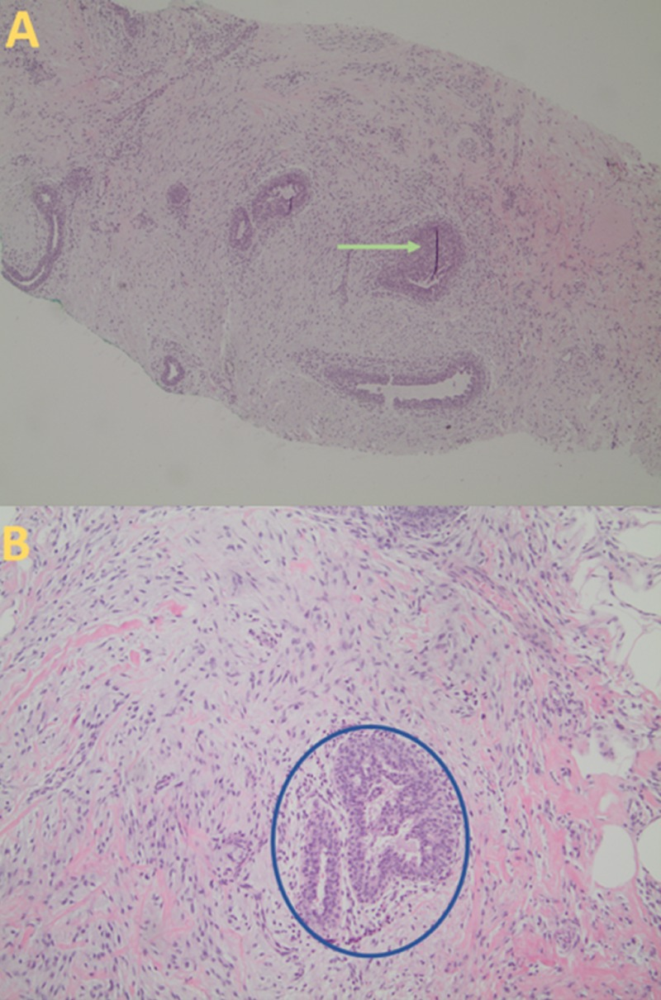

Histological Findings of Gynecomastia(A) An ultrasound-guided core biopsy shows increased stromal cellularity and edema at a magnification of 40 times (green arrow). (B) The histopathology sample demonstrates ductal epithelial hyperplasia with flat or papillary patterns, and increased periductal stromal cellularity (blue circle) at a magnification of 100 times.


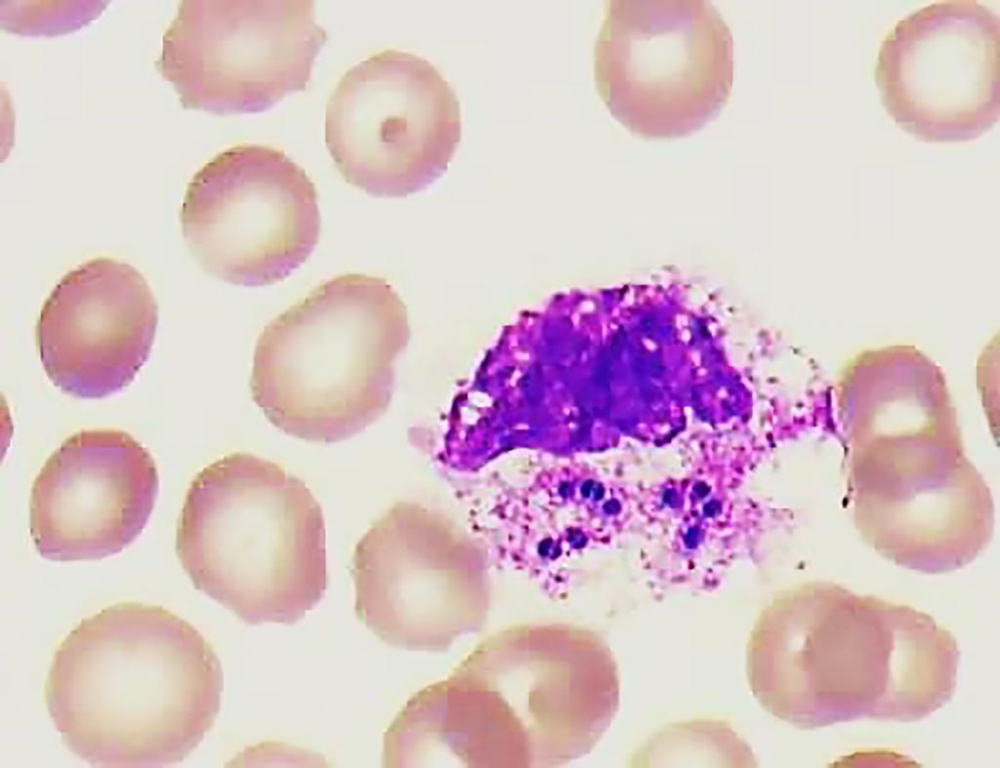

Image: Blood smear of patient with intracellular cocci in pairs inside a white blood cell, possibly indicating sepsis. Oncostatin-M is a biomarker for sepsis risk (Photo courtesy of Dr. Wim van der Meer).


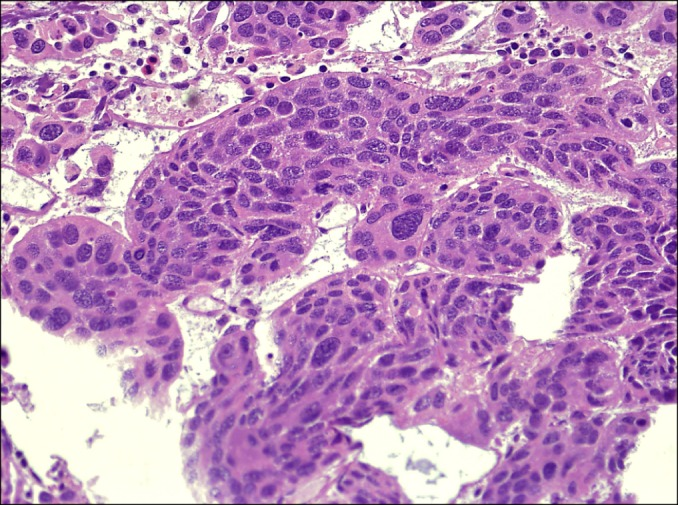

Bladder transurethral resection biopsy: high-grade urothelial carcinoma with invasion of the lamina propria by malignant epithelial tumor cells with large, pleomorphic nuclei (H&E, ×200).


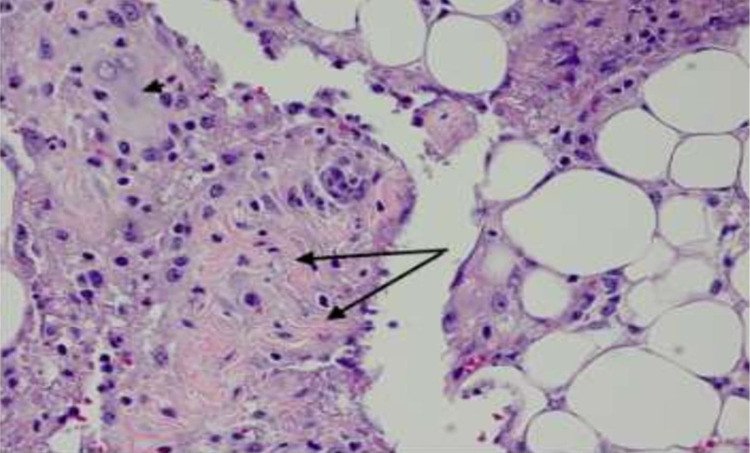

Omentum showing a dense inflammatory reaction, surrounding keratin deposits (long arrows) with the presence of giant cells (arrowhead)Hematoxylin-eosin, X40


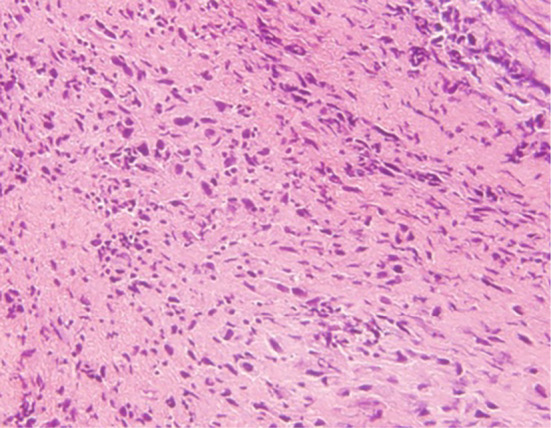

Histological findings of the biopsy specimens. The tumor is composed of spindle-shaped or polygonal cells (Hematoxylin and Eosin staining; original magnification, 200×).


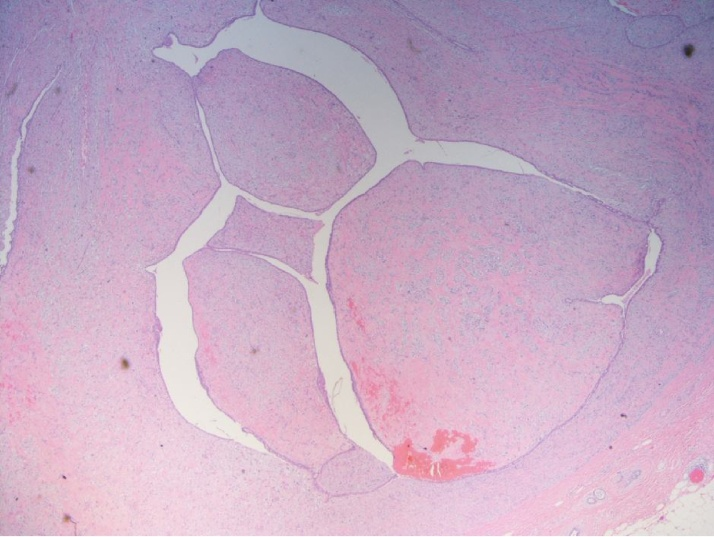

Architectural Pattern of Phyllodes Tumor.


In [19]:
for f,t in list(zip(df[best_descr].image_path,df[best_descr].caption))[0:10]:
    Image.open(bpath+'/'+f)
    print(t)